# Localization of Brain Tumors

Data Pre Processing

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob
import cv2
src_dir=r'C:\Users\PROMIT\Desktop\Brain_MRI\Dataset_MRI'

In [2]:
#Loading the black and white mask images
mask_files = glob(src_dir+'/*/*_mask*')
#Loading the brain images
image_files = [file.replace('_mask', '') for file in mask_files]

In [3]:
#Defining the function for labeling the masks
def mask_labelizer(mask_image):
    mask_image=cv2.imread(mask_image)
    label=np.max(mask_image)
    if(label>0):
        label=1
    else:
        label=0
    return label


In [4]:
#Assembling the MRI scans with their corresponding masks into a dataframe
MRI_DATA = pd.DataFrame(
    {              "images": image_files,
                   "masks": mask_files,
                   "label":[
                       mask_labelizer(mask) for mask in mask_files #Using List Apprehension
                   ]}
)
#Displaying the dataframe
MRI_DATA.head()

,images,masks,label
0,C:\Users\PROMIT\Desktop\Brain_MRI\Dataset_MRI\...,C:\Users\PROMIT\Desktop\Brain_MRI\Dataset_MRI\...,0
1,C:\Users\PROMIT\Desktop\Brain_MRI\Dataset_MRI\...,C:\Users\PROMIT\Desktop\Brain_MRI\Dataset_MRI\...,1
2,C:\Users\PROMIT\Desktop\Brain_MRI\Dataset_MRI\...,C:\Users\PROMIT\Desktop\Brain_MRI\Dataset_MRI\...,1
3,C:\Users\PROMIT\Desktop\Brain_MRI\Dataset_MRI\...,C:\Users\PROMIT\Desktop\Brain_MRI\Dataset_MRI\...,1
4,C:\Users\PROMIT\Desktop\Brain_MRI\Dataset_MRI\...,C:\Users\PROMIT\Desktop\Brain_MRI\Dataset_MRI\...,1


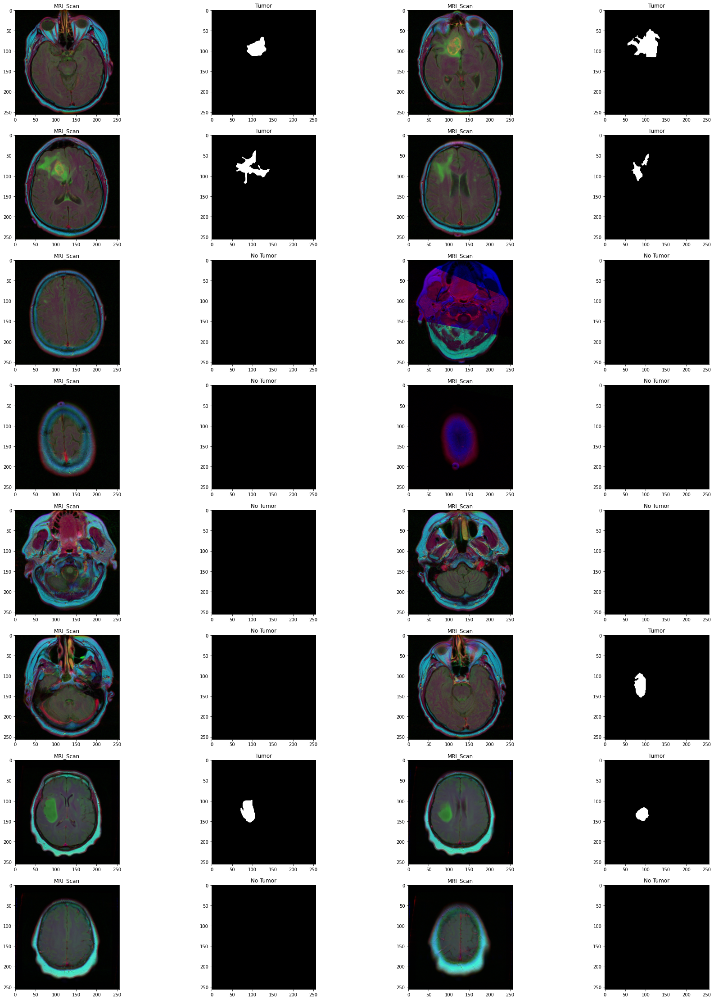

In [8]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=[30,40])
for i in range(32):
   
    if(i%2==0):
        plt.subplot(8,4,i+1)        
        plt.title('MRI_Scan')
        plt.imshow(np.array(cv2.imread(MRI_DATA['images'].iloc[i])))
        
    else:
        plt.subplot(8,4,i+1)
        label=mask_labelizer(MRI_DATA['masks'].iloc[i])
        if(label==0):
                label='No Tumor'
        else:
                label='Tumor'
        plt.title(label)
        plt.imshow(np.array(cv2.imread(MRI_DATA['masks'].iloc[i])))
       


    


For evaluating model performance on data which it hasnt been exposed to earlier, the same random state is used tosplit data into  train data and test data

In [9]:
from sklearn.model_selection import train_test_split
MRI_train,MRI_test=train_test_split(MRI_DATA,test_size=0.1,random_state=0)
print('Shape of training data : {}\nShape of test data: {} '.format(len(MRI_train),len(MRI_test)))

Shape of training data : 3536
Shape of test data: 393 


# Localization

# 1.Using model with Encoder Decoder based UNet Architecture:

Defining loss functions and metrices used for training the model

In [10]:
smooth=1.
from tensorflow.keras import backend as K
#-----------------------------------------------------------------------------------------------------------------------------------------------------------#
'''Function for returning dice coefficient'''
def DICE_COEFF(y_true, y_pred):
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred)
    return (2.0 * intersection + smooth) / (union + smooth)
#-----------------------------------------------------------------------------------------------------------------------------------------------------------#

'''Dice Coefficient Loss'''
def dice_coef_loss(y_true, y_pred):
    return 1 - DICE_COEFF(y_true, y_pred)

#----------------------------------------------------------------------------------------------------------------------------------------------------------#
'''Function for combining binary cross entropy with dice coeffcients for loss function'''
def bce_dice_loss(y_true, y_pred):
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    return dice_coef_loss(y_true, y_pred) + bce(y_true, y_pred)

#----------------------------------------------------------------------------------------------------------------------------------------------------------#

'''Function for Jacards coefficient'''
def IOU_JACARD(y_true, y_pred):
    y_true=K.flatten(y_true)
    y_pred=K.flatten(y_pred)
    intersection = K.sum(y_true * y_pred)
    sum_jac = K.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_jac - intersection + smooth)
    return jac


Loading pre-trained model

In [11]:
from tensorflow.keras.models import load_model
model = load_model(r'C:\Users\PROMIT\Desktop\Brain_MRI\Encoder_Decoder\Segmentation_MRI_BRAIN_A_Model.h5', custom_objects={'bce_dice_loss': bce_dice_loss,'IOU_JACARD':IOU_JACARD,'DICE_COEFF':DICE_COEFF})

In [ ]:
#Making predictions
def preprocessing_image(image_path):
    image=cv2.imread(image_path)
    image=image/255.
    return image
predictions=[]
for elem in range(MRI_test.shape[0]):
    img=preprocessing_image(MRI_test['images'].iloc[elem])
    img = cv2.resize(img ,(256,256))
    img = img[np.newaxis, :, :, :]
    pred=model.predict(img)
    predictions.append(pred)

def binarize_prediction(image):
    image[image>0.5]=1
    image[image<=0.5]=0
    return image
for elem in range(len(predictions)):
    predictions[elem]=binarize_prediction(predictions[elem])


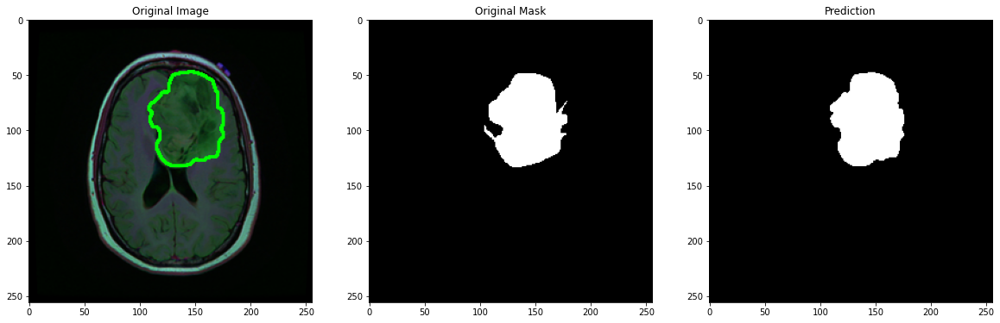

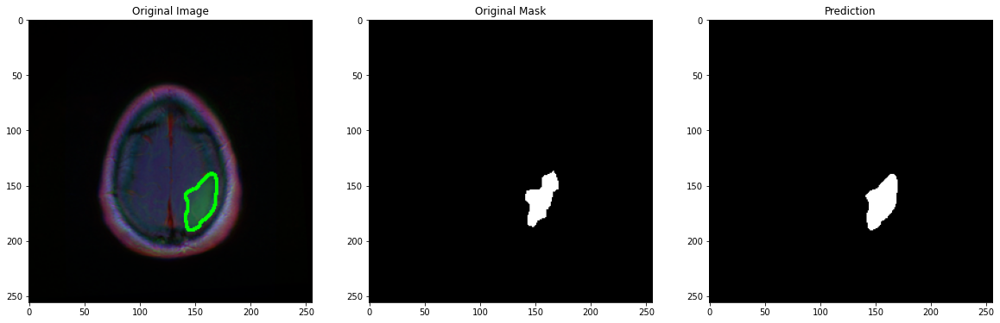

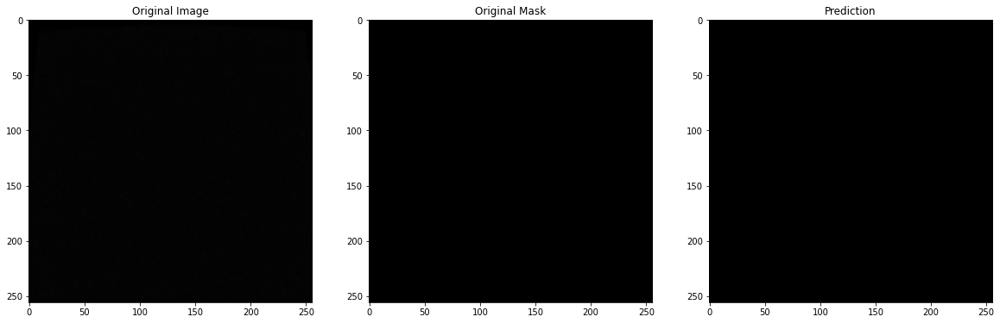

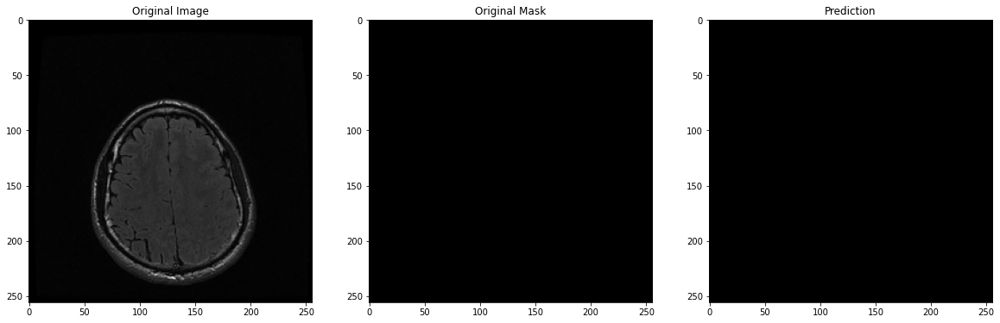

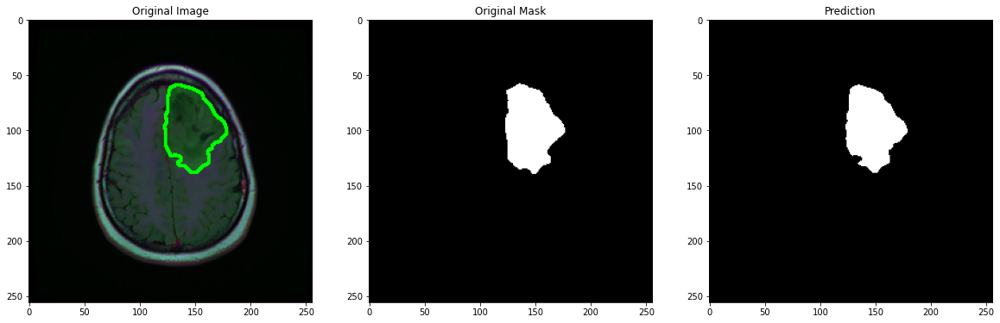

...

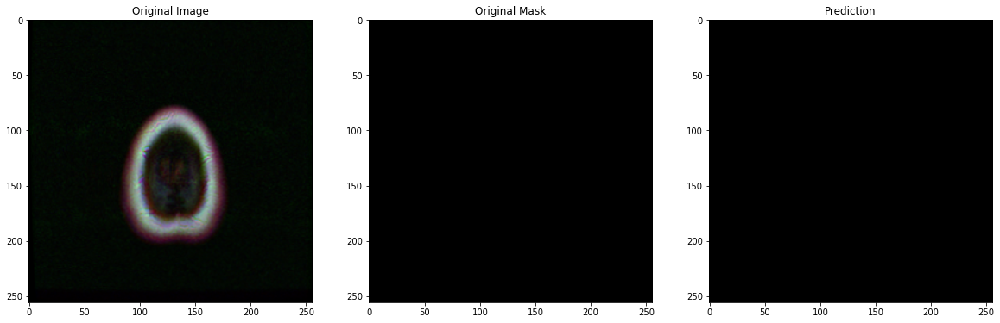

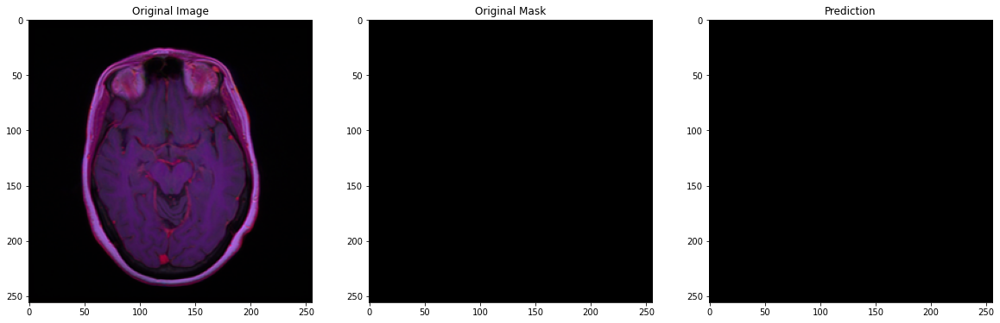

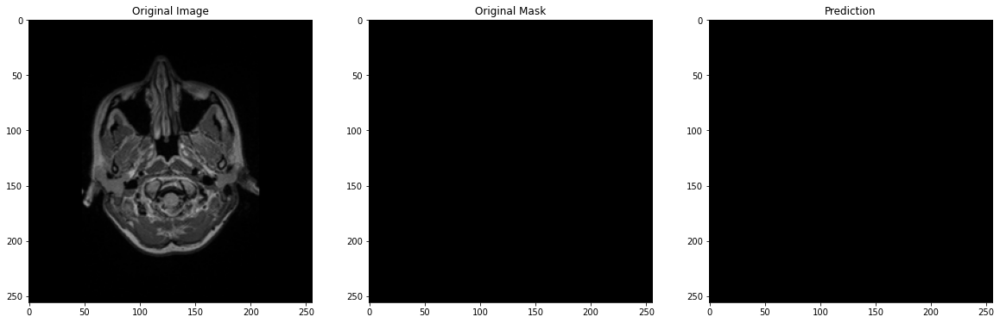

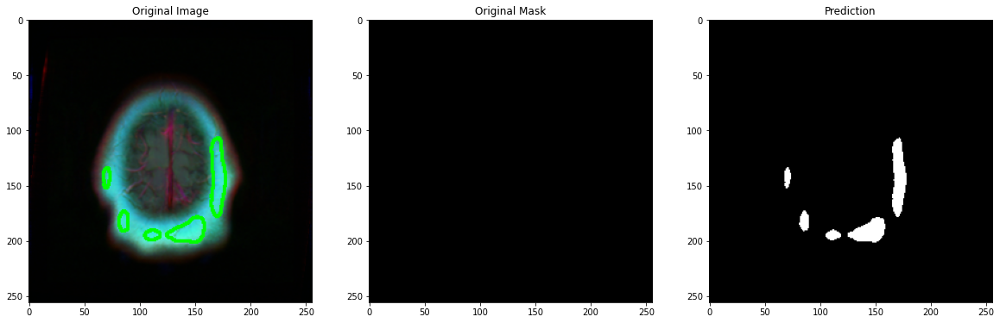

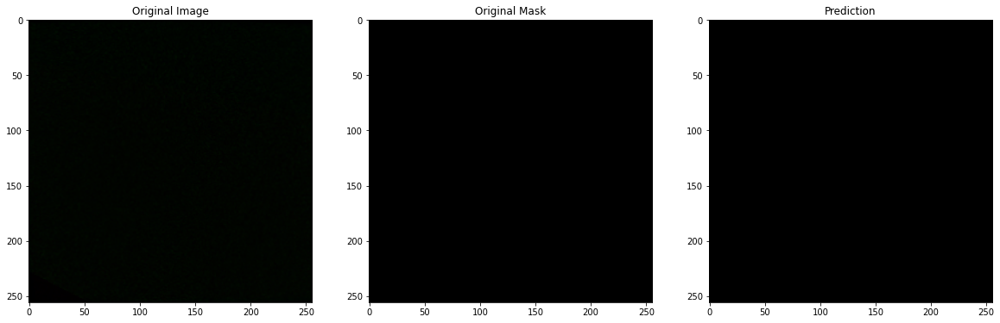

In [59]:
#Localizing tumors from their masks using Canny Edge Detection
sigma=0.33
for i in range(50):
    mask=predictions[i].astype('uint8')
    mask=np.squeeze(mask)
    mask_med=np.median(mask)
    lower = int(max(0, (1.0 - sigma) *mask_med))
    upper = int(min(255, (1.0 + sigma) *mask_med))
    edged = cv2.Canny(mask, lower, upper)
    (cnts, _) = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    shape=mask.copy()
    image=cv2.drawContours(cv2.imread(MRI_test['images'].iloc[i]), cnts, -1, (0, 255, 0), 2)
    plt.figure(figsize=(20,12))
    plt.subplot(1,3,1)
    plt.imshow(np.array(image))
    plt.title('Original Image')
    plt.subplot(1,3,2)
    plt.imshow(np.array(cv2.imread(MRI_test['masks'].iloc[i])))
    plt.title('Original Mask')
    plt.subplot(1,3,3)
    plt.imshow(np.squeeze(predictions[i]),cmap='gray')
    plt.title('Prediction')
    plt.show()

# 1.Using model with UNet Architecture having Resnet_50 layers:

In [42]:
from tensorflow.keras.models import load_model
model_2 = load_model(r'C:\Users\PROMIT\Desktop\Brain_MRI\Transfer_learning\MRI_Segment.hdf5', custom_objects={'bce_dice_loss': bce_dice_loss,'IOU_JACARD':IOU_JACARD,'DICE_COEFF':DICE_COEFF})

In [ ]:
predictions_2=[]
for elem in range(MRI_test.shape[0]):
    img=preprocessing_image(MRI_test['images'].iloc[elem])
    img = cv2.resize(img ,(256,256))
    img = img[np.newaxis, :, :, :]
    pred=model_2.predict(img)
    predictions_2.append(pred)
for elem in range(len(predictions)):
    predictions_2[elem]=binarize_prediction(predictions[elem])

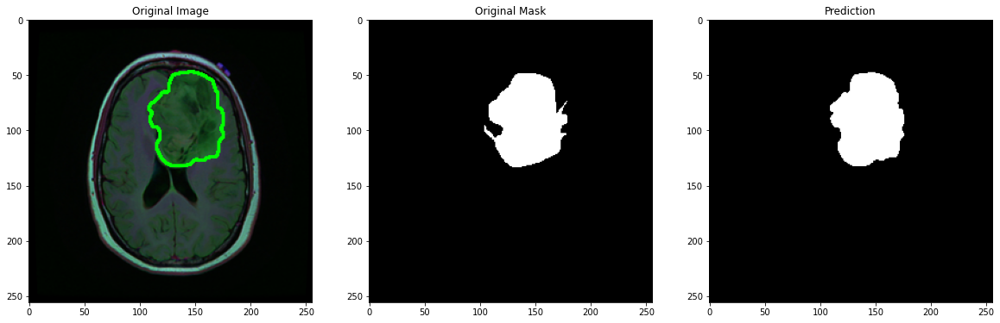

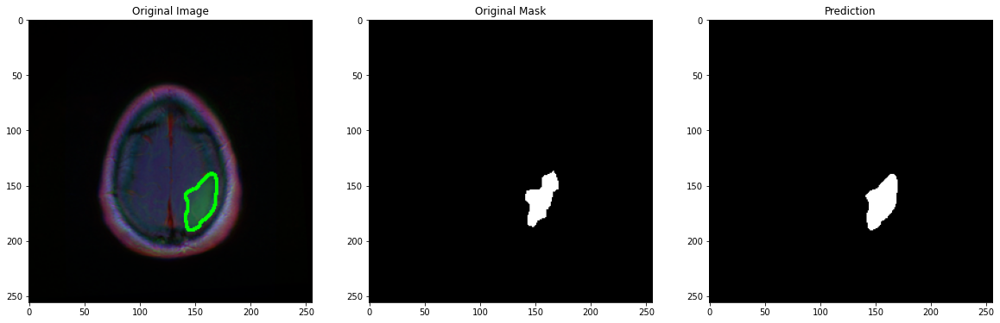

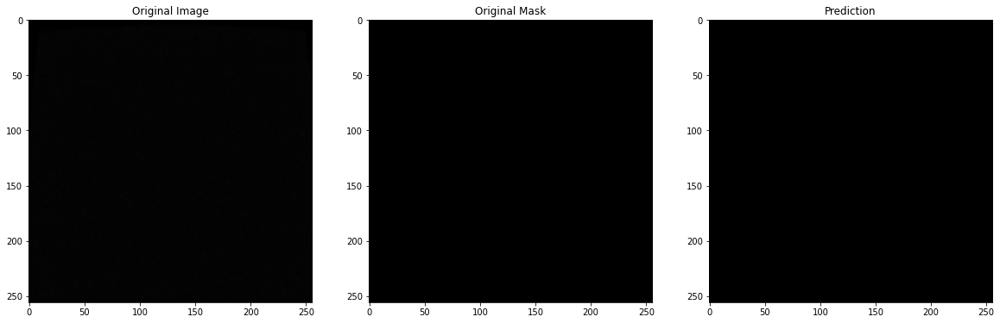

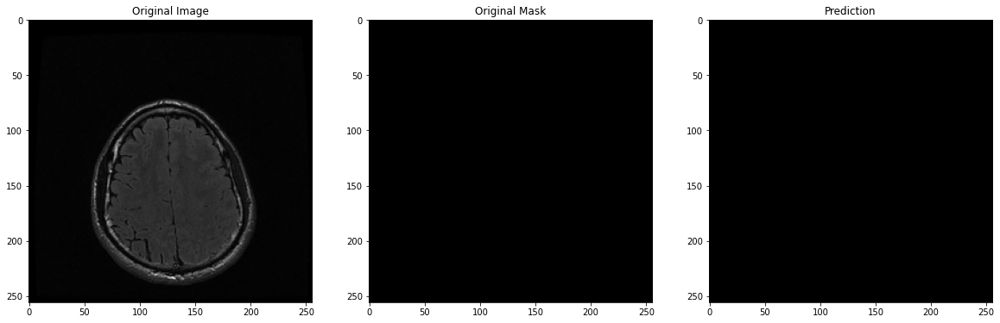

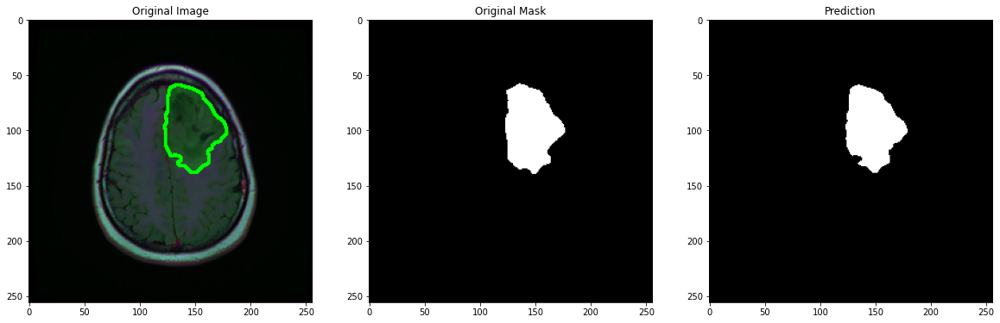

...

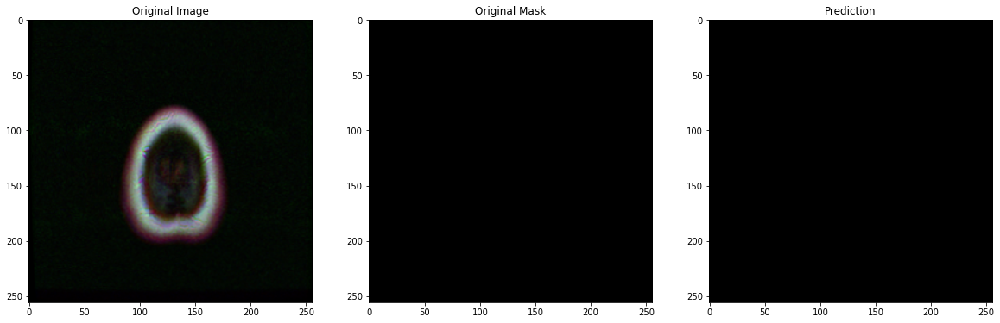

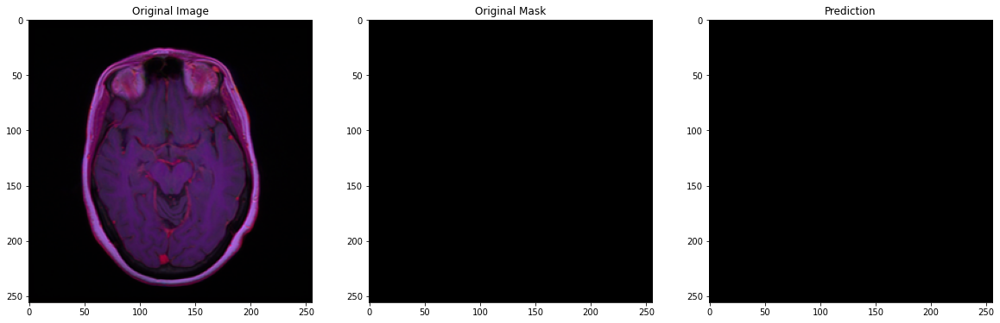

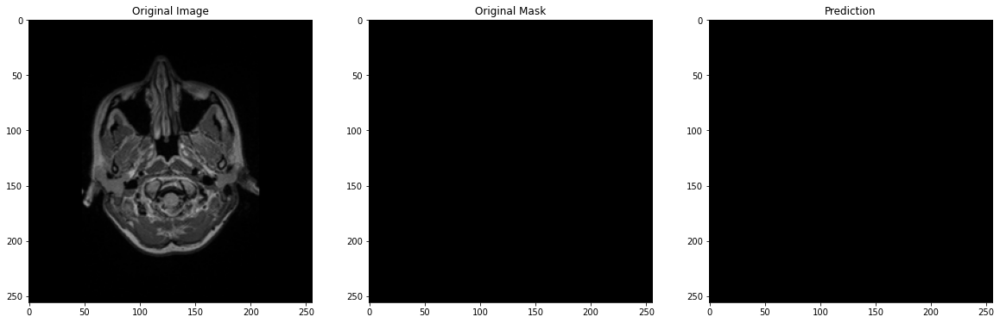

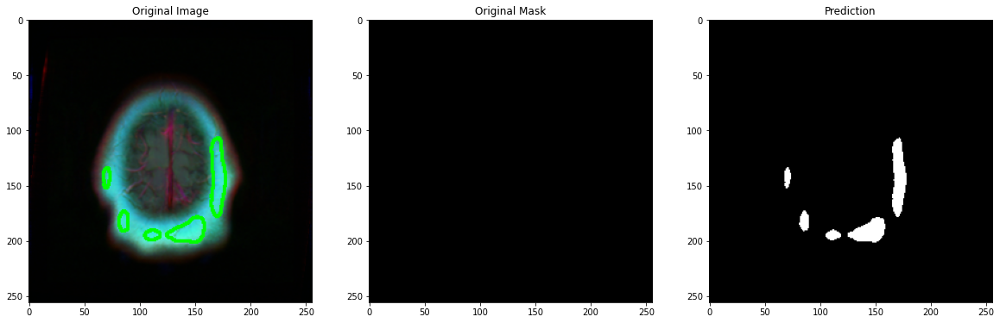

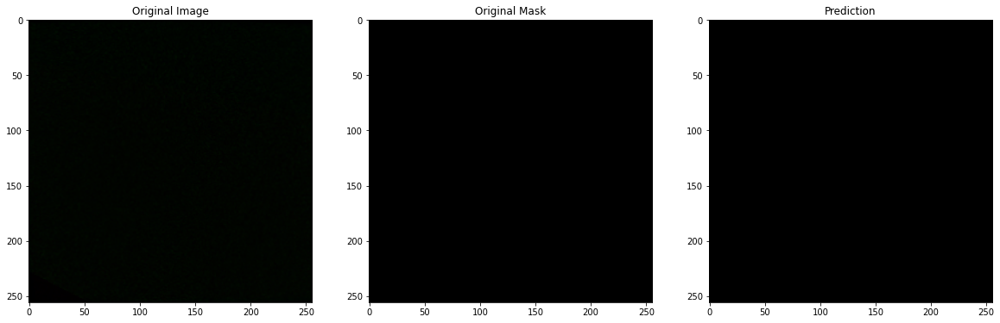

In [62]:
#Localizing tumors from their masks using Canny Edge Detection
sigma=0.33
for i in range(50):
    mask=predictions_2[i].astype('uint8')
    mask=np.squeeze(mask)
    mask_med=np.median(mask)
    lower = int(max(0, (1.0 - sigma) *mask_med))
    upper = int(min(255, (1.0 + sigma) *mask_med))
    edged = cv2.Canny(mask, lower, upper)
    (cnts, _) = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    shape=mask.copy()
    image=cv2.drawContours(cv2.imread(MRI_test['images'].iloc[i]), cnts, -1, (0, 255, 0), 2)
    plt.figure(figsize=(20,12))
    plt.subplot(1,3,1)
    plt.imshow(np.array(image))
    plt.title('Original Image')
    plt.subplot(1,3,2)
    plt.imshow(np.array(cv2.imread(MRI_test['masks'].iloc[i])))
    plt.title('Original Mask')
    plt.subplot(1,3,3)
    plt.imshow(np.squeeze(predictions[i]),cmap='gray')
    plt.title('Prediction')
    plt.show()